In [1]:
!pip inst03
all wordcloud
!pip install gtts
!pip install playsound

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

import tensorflow as tf
import keras
from keras.preprocessing.image import load_img
import string
import time
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer

from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras import Input
from PIL import Image
from tqdm import tqdm

In [2]:
import glob
from gtts import gTTS
from playsound import playsound
from IPython import display

import collections
import wordcloud
from wordcloud import WordCloud, STOPWORDS

In [3]:
import numpy as np 
import pandas as pd

directory_path = r'C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images'
import os
for dirname, _, filenames in os.walk(directory_path):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\1000268201_693b08cb0e.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\1001773457_577c3a7d70.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\1002674143_1b742ab4b8.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\1003163366_44323f5815.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\1007129816_e794419615.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\1007320043_627395c3d8.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\1009434119_febe49276a.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\1012212859_01547e3f17.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\1015118661_980735411b.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\1015584366_dfcec3c85a.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\101654506_8eb26cfb60.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\101669240_b2d3e7f17b.jpg
C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images\1016887272_031

In [4]:
images=r'C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images'

all_imgs = glob.glob(images + '/*.jpg',recursive=True)
print("The total images present in the dataset: {}".format(len(all_imgs)))

The total images present in the dataset: 8091


C:\Users\SIDDHARTH\AppData\Local\Temp\ipykernel_12208\3835355598.py:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  ax.imshow(imageio.imread(image), cmap=None)


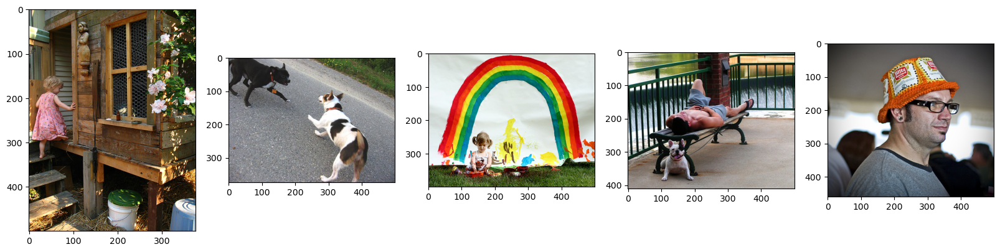

In [5]:
import imageio

Display_Images = all_imgs[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(20)

for ax, image in zip(axes, Display_Images):
  ax.imshow(imageio.imread(image), cmap=None)

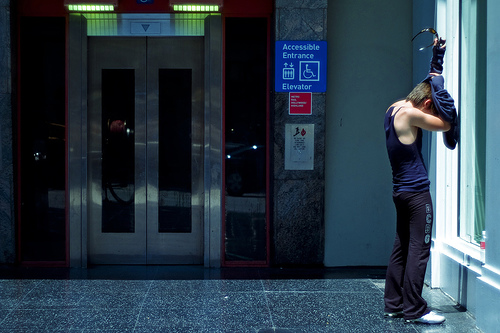

In [6]:
import random
Image.open(all_imgs[random.randrange(40, 60, 3)])

In [7]:
text_file = r'C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\captions.txt\captions.txt'

def load_doc(filename):
    open_file = open(text_file, 'r', encoding='latin-1' )
    text = open_file.read() 
    open_file.close()
    
    return text

doc = load_doc(text_file)
print(doc[:300])

image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing


In [8]:
img_path = r'C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\Images'

all_img_id = []  
all_img_vector = []  
annotations = []  

with open(r'C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\captions.txt\captions.txt', 'r') as fo:
    next(fo) 
    for line in fo:
        split_arr = line.split(',')
        all_img_id.append(split_arr[0])
        annotations.append(split_arr[1].rstrip('\n.')) 
        
        full_img_path = os.path.join(img_path, split_arr[0])
        all_img_vector.append(full_img_path)

df = pd.DataFrame(list(zip(all_img_id, all_img_vector, annotations)), columns=['ID', 'Path', 'Captions'])

df

,ID,Path,Captions
0,1000268201_693b08cb0e.jpg,C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\I...,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\I...,A girl going into a wooden building
2,1000268201_693b08cb0e.jpg,C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\I...,A little girl climbing into a wooden playhouse
3,1000268201_693b08cb0e.jpg,C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\I...,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\I...,A little girl in a pink dress going into a woo...
...,...,...,...
40450,997722733_0cb5439472.jpg,C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\I...,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\I...,A man is rock climbing high in the air
40452,997722733_0cb5439472.jpg,C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\I...,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,C:\Users\SIDDHARTH\Desktop\Datasets\Blind fr\I...,A rock climber in a red shirt


In [9]:
all_img_vector

['C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1000268201_693b08cb0e.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1000268201_693b08cb0e.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1000268201_693b08cb0e.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1000268201_693b08cb0e.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1000268201_693b08cb0e.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1001773457_577c3a7d70.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1001773457_577c3a7d70.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1001773457_577c3a7d70.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1001773457_577c3a7d70.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1001773457_577c3a7d70.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1002674143_1b742ab4b8.jpg',
 'C:\\Users\\SIDDHART

In [10]:
len (annotations)

40455

In [11]:
type (annotations)

list

In [12]:
print("Total captions present in the dataset: "+ str(len(annotations)))
print("Total images present in the dataset: " + str(len(all_imgs)))

Total captions present in the dataset: 40455
Total images present in the dataset: 8091


In [13]:
vocabulary = [word.lower() for line in annotations for word in line.split()]

val_count = Counter(vocabulary) 
val_count

Counter({'a': 60196,
         'in': 18174,
         'the': 17507,
         'on': 10357,
         'is': 9069,
         'and': 8057,
         'dog': 7948,
         'with': 7304,
         'man': 7137,
         'of': 6495,
         'two': 5132,
         'white': 3706,
         'black': 3620,
         'boy': 3514,
         'are': 3365,
         'woman': 3304,
         'girl': 3277,
         'to': 3005,
         'wearing': 2916,
         'people': 2811,
         'at': 2810,
         'water': 2676,
         'young': 2587,
         'red': 2553,
         'brown': 2457,
         'an': 2325,
         'his': 2255,
         'blue': 2125,
         'dogs': 2095,
         'running': 1996,
         'through': 1978,
         'playing': 1954,
         'while': 1807,
         'down': 1755,
         'little': 1736,
         'shirt': 1735,
         'standing': 1702,
         'ball': 1678,
         'grass': 1565,
         'person': 1515,
         'child': 1507,
         'snow': 1439,
         'jumping': 1430

a :  60196
in :  18174
the :  17507
on :  10357
is :  9069
and :  8057
dog :  7948
with :  7304
man :  7137
of :  6495
two :  5132
white :  3706
black :  3620
boy :  3514
are :  3365
woman :  3304
girl :  3277
to :  3005
wearing :  2916
people :  2811
at :  2810
water :  2676
young :  2587
red :  2553
brown :  2457
an :  2325
his :  2255
blue :  2125
dogs :  2095
running :  1996


Text(0, 0.5, 'Count')

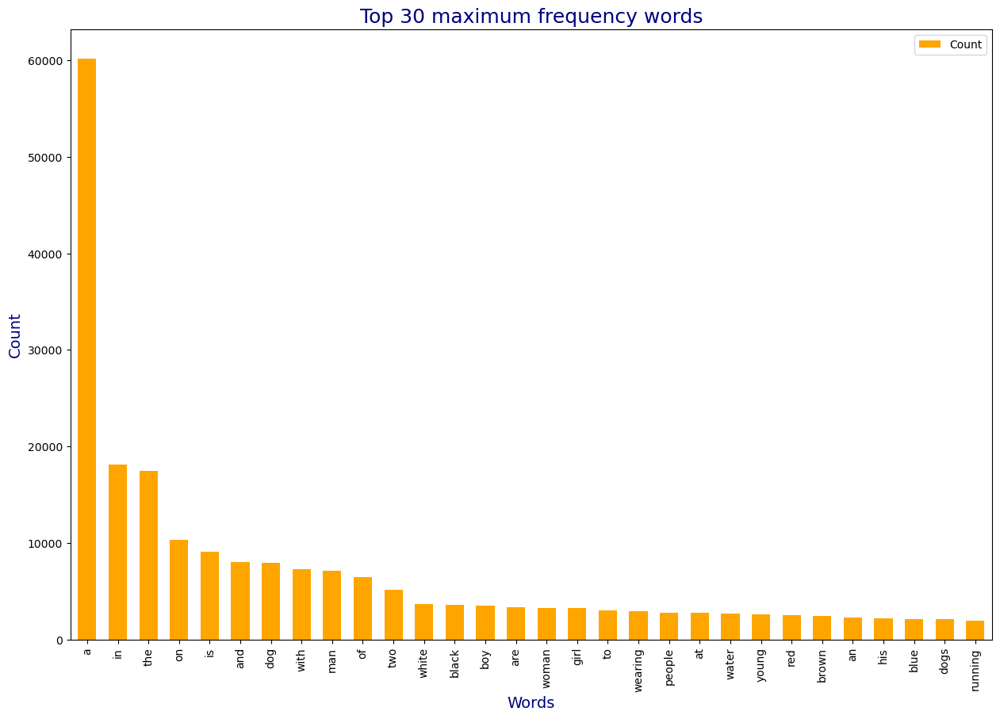

In [14]:
for word, count in val_count.most_common(30):
  print(word, ": ", count)

lst = val_count.most_common(30)
most_common_words_df = pd.DataFrame(lst, columns = ['Word', 'Count'])
most_common_words_df.plot.bar(x='Word', y='Count', width=0.6, color='orange', figsize=(15, 10))
plt.title("Top 30 maximum frequency words", fontsize = 18, color= 'navy')
plt.xlabel("Words", fontsize = 14, color= 'navy')
plt.ylabel("Count", fontsize = 14, color= 'navy')

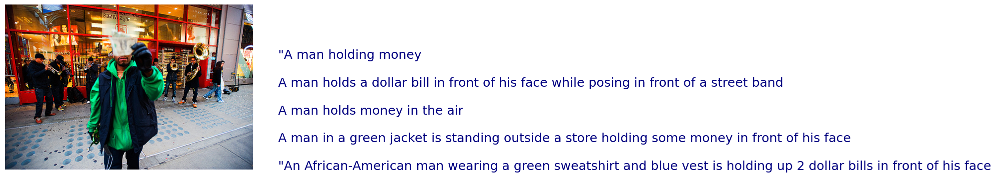

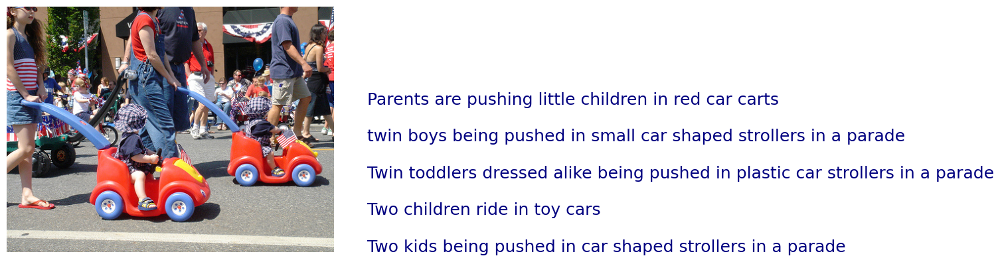

In [15]:
def caption_with_img_plot(image_id, frame):
    capt = ("\n" * 2).join(frame[frame['ID'] == image_id].Captions.to_list())
    fig, ax = plt.subplots()
    ax.set_axis_off()

    idx = df.ID.to_list().index(image_id)
    img_path = df.Path.iloc[idx]

    if not os.path.exists(img_path):
        img_path = img_path.replace("Images", "Images/")  
        
    im = Image.open(img_path)
    w, h = im.size
    ax.imshow(im)
    ax.text(w + 50, h, capt, fontsize=18, color='navy')

caption_with_img_plot(df.ID.iloc[8049], df)
caption_with_img_plot(df.ID.iloc[809], df)

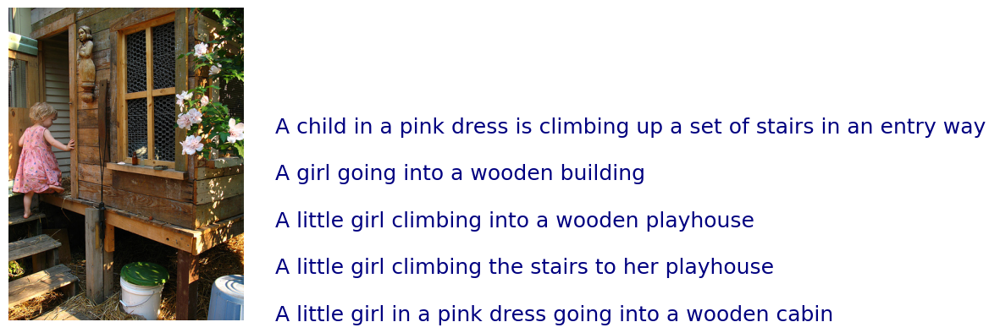

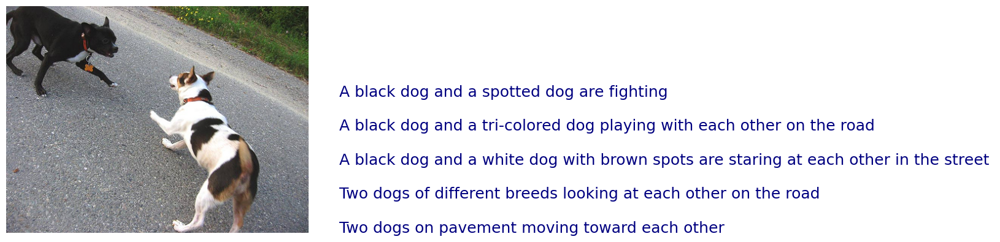

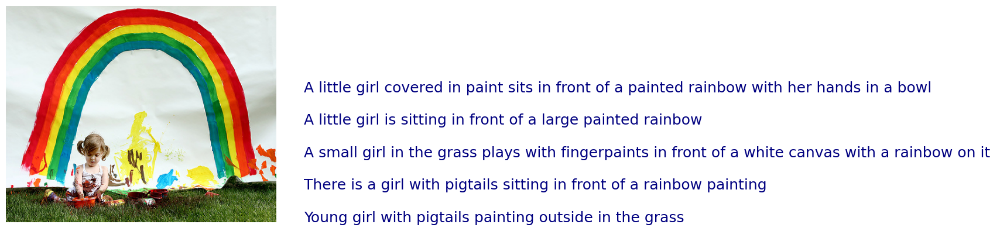

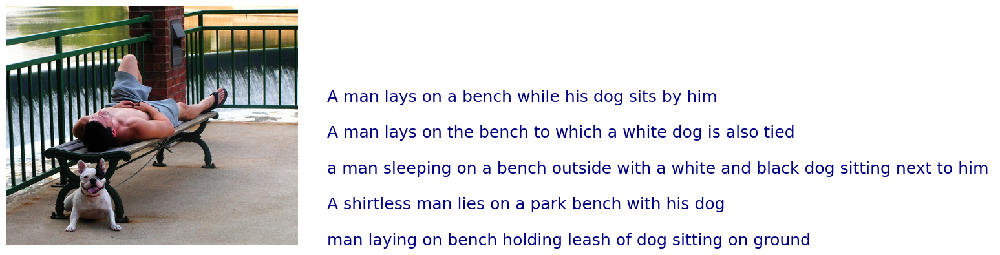

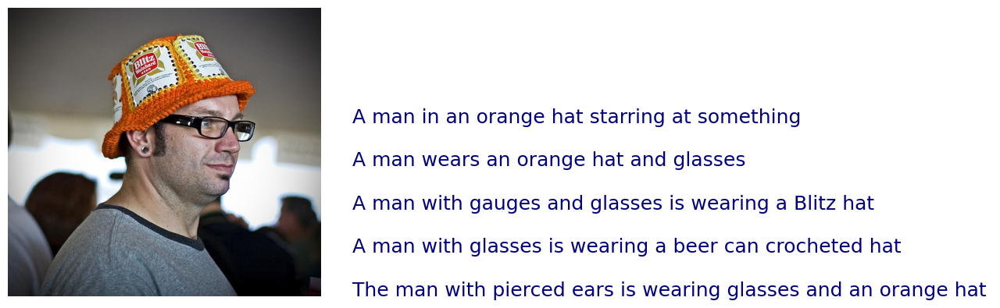

In [16]:
def execute_img_capt(start, end, frame) :
  for r in range(start, end) :
    caption_with_img_plot(frame.ID.drop_duplicates().iloc[r], frame)

execute_img_capt(0, 5, df)  

In [17]:
rem_punct = str.maketrans('', '', string.punctuation)
for r in range(len(annotations)) :
  line = annotations[r]
  line = line.split()

  line = [word.lower() for word in line]

  line = [word.translate(rem_punct) for word in line]
  line = [word for word in line if len(word) > 1]

  line = [word for word in line if word.isalpha()]

  annotations[r] = ' '.join(line)

In [18]:
annotations = ['<start>' + ' ' + line + ' ' + '<end>' for line in annotations]

all_img_path = all_img_vector

In [19]:
annotations[0:5]

['<start> child in pink dress is climbing up set of stairs in an entry way <end>',
 '<start> girl going into wooden building <end>',
 '<start> little girl climbing into wooden playhouse <end>',
 '<start> little girl climbing the stairs to her playhouse <end>',
 '<start> little girl in pink dress going into wooden cabin <end>']

In [20]:
top_word_cnt = 5000
tokenizer = Tokenizer(num_words = top_word_cnt+1, filters= '!"#$%^&*()_+.,:;-?/~`{}[]|\=@ ',
                      lower = True, char_level = False, 
                      oov_token = 'UNK')

In [21]:
tokenizer.fit_on_texts(annotations)

train_seqs = tokenizer.texts_to_sequences(annotations)

In [22]:
tokenizer.word_index['PAD'] = 0
tokenizer.index_word[0] = 'PAD'

In [24]:
tokenizer.index_word

{1: 'UNK',
 2: '<start>',
 3: '<end>',
 4: 'in',
 5: 'the',
 6: 'on',
 7: 'is',
 8: 'and',
 9: 'dog',
 10: 'with',
 11: 'man',
 12: 'of',
 13: 'two',
 14: 'white',
 15: 'black',
 16: 'boy',
 17: 'are',
 18: 'woman',
 19: 'girl',
 20: 'to',
 21: 'wearing',
 22: 'people',
 23: 'at',
 24: 'water',
 25: 'young',
 26: 'red',
 27: 'brown',
 28: 'an',
 29: 'his',
 30: 'blue',
 31: 'dogs',
 32: 'running',
 33: 'through',
 34: 'playing',
 35: 'while',
 36: 'down',
 37: 'little',
 38: 'shirt',
 39: 'standing',
 40: 'ball',
 41: 'grass',
 42: 'person',
 43: 'child',
 44: 'snow',
 45: 'jumping',
 46: 'over',
 47: 'three',
 48: 'front',
 49: 'sitting',
 50: 'small',
 51: 'field',
 52: 'up',
 53: 'holding',
 54: 'large',
 55: 'group',
 56: 'by',
 57: 'green',
 58: 'yellow',
 59: 'children',
 60: 'walking',
 61: 'men',
 62: 'her',
 63: 'into',
 64: 'beach',
 65: 'air',
 66: 'near',
 67: 'jumps',
 68: 'mouth',
 69: 'street',
 70: 'runs',
 71: 'for',
 72: 'another',
 73: 'riding',
 74: 'from',
 75: 'it

In [25]:
tokenizer_top_words = [word for line in annotations for word in line.split() ]

tokenizer_top_words_count = collections.Counter(tokenizer_top_words)
tokenizer_top_words_count

Counter({'<start>': 40455,
         '<end>': 40455,
         'in': 18182,
         'the': 17676,
         'on': 10367,
         'is': 9069,
         'and': 8057,
         'dog': 7956,
         'with': 7308,
         'man': 7164,
         'of': 6496,
         'two': 5546,
         'white': 3710,
         'black': 3627,
         'boy': 3534,
         'are': 3365,
         'woman': 3320,
         'girl': 3284,
         'to': 3005,
         'wearing': 2917,
         'people': 2837,
         'at': 2819,
         'water': 2676,
         'young': 2610,
         'red': 2553,
         'brown': 2471,
         'an': 2358,
         'his': 2255,
         'blue': 2125,
         'dogs': 2097,
         'running': 1996,
         'through': 1979,
         'playing': 1954,
         'while': 1818,
         'down': 1755,
         'little': 1750,
         'shirt': 1735,
         'standing': 1703,
         'ball': 1678,
         'grass': 1565,
         'person': 1521,
         'child': 1517,
         'snow':

<start> :  40455
<end> :  40455
in :  18182
the :  17676
on :  10367
is :  9069
and :  8057
dog :  7956
with :  7308
man :  7164
of :  6496
two :  5546
white :  3710
black :  3627
boy :  3534
are :  3365
woman :  3320
girl :  3284
to :  3005
wearing :  2917
people :  2837
at :  2819
water :  2676
young :  2610
red :  2553
brown :  2471
an :  2358
his :  2255
blue :  2125
dogs :  2097


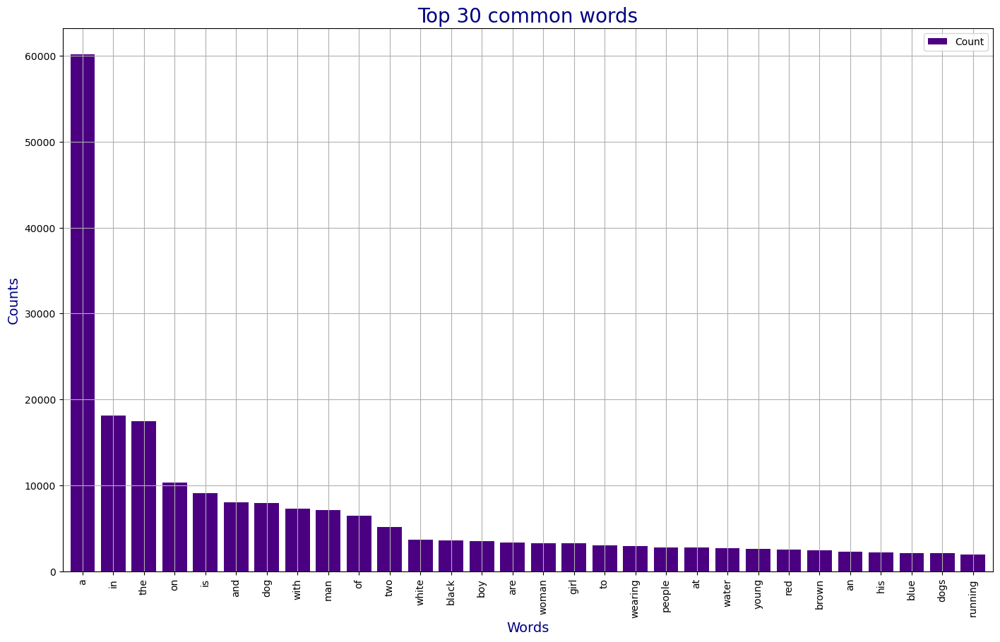

In [26]:
for word, count in tokenizer_top_words_count.most_common(30) :
  print(word, ": ", count)

tokens = tokenizer_top_words_count.most_common(30)
most_com_words_df = pd.DataFrame(tokens, columns = ['Word', 'Count'])

most_common_words_df.plot.bar(x = 'Word', y= 'Count', width=0.8, color = 'indigo', figsize = (17, 10))
plt.title('Top 30 common words', fontsize =20, color= 'navy')
plt.xlabel('Words', fontsize =14, color= 'navy')
plt.ylabel('Counts', fontsize =14, color= 'navy')
plt.grid(True)

In [27]:
train_seqs_len = [len(seq) for seq in train_seqs]

longest_word_length = max(train_seqs_len)

cap_vector= tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding= 'post', maxlen = longest_word_length,
                                                          dtype='int32', value=0)

print("The shape of Caption vector is :" + str(cap_vector.shape))

The shape of Caption vector is :(40455, 31)


In [28]:
preprocessed_image = []
IMAGE_SHAPE = (299, 299)

In [29]:
tf.keras.backend.image_data_format()

'channels_last'

In [30]:
for img in all_imgs[0:5] :
    img = tf.io.read_file(img, name=None)

    img = tf.image.decode_jpeg(img, channels=0)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)

    preprocessed_image.append(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape after resize :  (299, 299, 3)
Shape after resize :  (299, 299, 3)
Shape after resize :  (299, 299, 3)
Shape after resize :  (299, 299, 3)
Shape after resize :  (299, 299, 3)


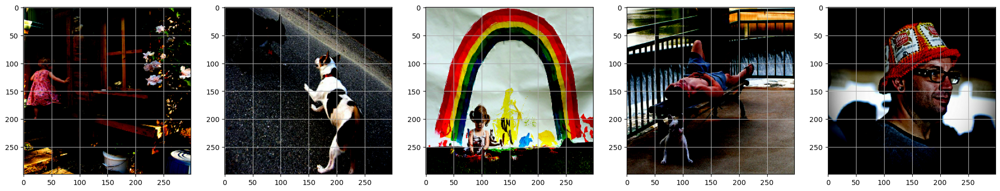

In [31]:
Display_Images = preprocessed_image[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(25)

for ax, image in zip(axes, Display_Images) :
  print('Shape after resize : ', image.shape)
  ax.imshow(image)
  ax.grid('off')

In [32]:
def load_images(image_path) :
  img = tf.io.read_file(image_path, name = None)
  img = tf.image.decode_jpeg(img, channels=0)
  img = tf.image.resize(img, IMAGE_SHAPE)
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  return img, image_path

In [33]:
all_img_vector

['C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1000268201_693b08cb0e.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1000268201_693b08cb0e.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1000268201_693b08cb0e.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1000268201_693b08cb0e.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1000268201_693b08cb0e.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1001773457_577c3a7d70.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1001773457_577c3a7d70.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1001773457_577c3a7d70.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1001773457_577c3a7d70.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1001773457_577c3a7d70.jpg',
 'C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1002674143_1b742ab4b8.jpg',
 'C:\\Users\\SIDDHART

In [36]:
training_list = sorted(set(all_img_vector))

New_Img = tf.data.Dataset.from_tensor_slices(training_list)

New_Img = New_Img.map(load_images, num_parallel_calls = tf.data.experimental.AUTOTUNE)

New_Img = New_Img.batch(64, drop_remainder=False)

In [39]:
New_Img

<_BatchDataset element_spec=(TensorSpec(shape=(None, 299, 299, None), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [40]:
path_train, path_test, caption_train, caption_test = train_test_split(all_img_vector, cap_vector, test_size = 0.2, random_state = 42)

In [41]:
print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(caption_train)))
print("Testing data for Captions: " + str(len(caption_test)))

Training data for images: 32364
Testing data for images: 8091
Training data for Captions: 32364
Testing data for Captions: 8091


In [45]:
image_model = tf.keras.applications.InceptionV3(include_top=False,weights='imagenet')

new_input = image_model.input 
hidden_layer = image_model.layers[-1].output  

image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)

In [52]:
image_features_extract_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, None,      │        864 │ input_layer[0][0] │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, None,      │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, None,      │      9,216 │ activation[0][0]  │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, None,      │     18,432 │ activation_1[0][… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, None,      │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, None,      │      5,120 │ max_pooling2d[0]… │
│                     │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, None,      │    138,240 │ activation_3[0][… │
│                     │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, None,      │          0 │ batch_normalizat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 21,768,352 (83.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [54]:
img_features = {}
for image, image_path in tqdm(New_Img) :
  batch_features = image_features_extract_model(image)
  batch_features_flattened = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))

  for batch_feat, path in zip(batch_features_flattened, image_path) :
    feature_path = path.numpy().decode('utf-8')
    img_features[feature_path] = batch_feat.numpy()

100%|██████████| 127/127 [04:32<00:00,  2.15s/it]


In [56]:
batch_features

<tf.Tensor: shape=(27, 8, 8, 2048), dtype=float32, numpy=
array([[[[0.0000000e+00, 7.7464305e-02, 0.0000000e+00, ...,
          2.3183781e-01, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          1.0778828e-01, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 1.9403377e-01, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 1.8575472e-01],
         ...,
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          9.4266847e-02, 0.0000000e+00, 5.0578976e-01],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

        [[0.0000000e+00, 4.2300707e-01, 1.3445519e-02, ...,
          2.3366892e-01, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          4.9977571e-02, 0.0000000e+00, 0.0000000e+00]

In [57]:
batch_features_flattened

<tf.Tensor: shape=(27, 64, 2048), dtype=float32, numpy=
array([[[0.0000000e+00, 7.7464305e-02, 0.0000000e+00, ...,
         2.3183781e-01, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.0778828e-01, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 1.9403377e-01, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 1.8575472e-01],
        ...,
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 1.6569399e+00, 0.0000000e+00],
        [0.0000000e+00, 4.0262255e-01, 0.0000000e+00, ...,
         0.0000000e+00, 3.1792119e-01, 0.0000000e+00],
        [0.0000000e+00, 2.5347655e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

       [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.2506047e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 7.8491904e-02, ...,
         1.2064245e+00, 0.0000000e+00, 0.0000000e+00],
        [0.000000

In [59]:
len(img_features)

8091

In [64]:
batch_feat.shape

TensorShape([64, 2048])

In [65]:
import more_itertools
top_5 = more_itertools.take(5, img_features.items())

top_5

[('C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1000268201_693b08cb0e.jpg',
  array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.        ],
         [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.16987166],
         [0.        , 0.        , 1.0105928 , ..., 0.        , 0.        ,
          0.06111807],
         ...,
         [0.        , 0.        , 2.0380397 , ..., 1.20297   , 0.        ,
          1.9924095 ],
         [0.        , 0.        , 0.9046875 , ..., 0.        , 0.        ,
          0.        ],
         [0.        , 1.2527285 , 0.        , ..., 0.        , 0.        ,
          0.        ]], dtype=float32)),
 ('C:\\Users\\SIDDHARTH\\Desktop\\Datasets\\Blind fr\\Images\\1001773457_577c3a7d70.jpg',
  array([[0.        , 0.6636789 , 0.46285778, ..., 0.        , 0.        ,
          3.332265  ],
         [0.        , 1.2268164 , 0.        , ..., 0.        , 0.2539023 ,
          3.3295412 ],
    

In [71]:
def map(image_name, caption):
    img_tensor = img_features[image_name.decode('utf-8')]
    return img_tensor, caption

In [77]:
BUFFER_SIZE = 1000
BATCH_SIZE = 64
def gen_dataset(img, capt):
    data = tf.data.Dataset.from_tensor_slices((img, capt))
    data = data.map(lambda ele1, ele2 : tf.numpy_function(map, [ele1, ele2], [tf.float32, tf.int32]),
                    num_parallel_calls = tf.data.experimental.AUTOTUNE)
    
     
    data = (data.shuffle(BUFFER_SIZE, reshuffle_each_iteration= True).batch(BATCH_SIZE, drop_remainder = False)
    .prefetch(tf.data.experimental.AUTOTUNE))
    return data

In [78]:
train_dataset = gen_dataset(path_train,caption_train)
test_dataset = gen_dataset(path_test,caption_test)

In [82]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  
print(sample_cap_batch.shape) 

(64, 64, 2048)
(64, 31)


In [87]:
embedding_dim = 256 
units = 512
vocab_size = 5001
train_num_steps = len(path_train) // BATCH_SIZE 
test_num_steps = len(path_test) // BATCH_SIZE  

max_length = 31
feature_shape = batch_feat.shape[1]
attention_feature_shape = batch_feat.shape[0]

In [88]:
tf.compat.v1.reset_default_graph()
print(tf.compat.v1.get_default_graph())

In [89]:
class Encoder(Model):
    def __init__(self,embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) 
        
    def call(self, features):
        features =  self.dense(features) 
        features =  tf.keras.activations.relu(features, max_value=None, threshold=0)
        return features

In [92]:
encoder=Encoder(embedding_dim)

In [93]:
from tensorflow.keras.utils import plot_model

In [94]:
class Attention_model(Model):
    def __init__(self, units):
        super(Attention_model, self).__init__()
        self.W1 = tf.keras.layers.Dense(units) 
        self.W2 = tf.keras.layers.Dense(units) 
        self.V = tf.keras.layers.Dense(1) 
        self.units=units

    def call(self, features, hidden):
        hidden_with_time_axis = hidden[:, tf.newaxis]
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))  
        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1) 
        context_vector = attention_weights * features 
        context_vector = tf.reduce_sum(context_vector, axis=1)          
        return context_vector, attention_weights

In [95]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units=units
        self.attention = Attention_model(self.units) 
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) 
        self.gru = tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform')
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer
        

    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) 
        embed = self.embed(x) 
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) 
        output,state = self.gru(embed) 
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) 
        output = self.d2(output) 
        
        return output, state, attention_weights
    
    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [96]:
decoder=Decoder(embedding_dim, units, vocab_size)

In [97]:
features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) 
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) 
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape))

Feature shape from Encoder: (64, 64, 256)
Predcitions shape from Decoder: (64, 5001)
Attention weights shape from Decoder: (64, 64, 1)


In [98]:
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)  
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True, reduction = tf.keras.losses.Reduction.NONE)

In [99]:
def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask    
    return tf.reduce_mean(loss_)

In [100]:
checkpoint_path = "Flickr8K/checkpoint1"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [101]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [102]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    
    with tf.GradientTape() as tape:
        encoder_op = encoder(img_tensor)
        for r in range(1, target.shape[1]) :
          predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
          loss = loss + loss_function(target[:, r], predictions) 
          dec_input = tf.expand_dims(target[:, r], 1)  

    avg_loss = (loss/ int(target.shape[1])) 
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars)
    optimizer.apply_gradients(zip(grad, trainable_vars))

    return loss, avg_loss

In [103]:
@tf.function
def test_step(img_tensor, target):
    loss = 0

    hidden = decoder.init_state(batch_size = target.shape[0])

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    with tf.GradientTape() as tape:
      encoder_op = encoder(img_tensor)
        
      for r in range(1, target.shape[1]) :
        predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
        loss = loss + loss_function(target[:, r], predictions)

        dec_input = tf.expand_dims(target[: , r], 1)

    avg_loss = (loss/ int(target.shape[1])) 
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars) 

    optimizer.apply_gradients(zip(grad, trainable_vars))                      


    return loss, avg_loss

In [104]:
def test_loss_cal(test_dataset):
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(test_dataset) :
      batch_loss, t_loss = test_step(img_tensor, target)
      total_loss = total_loss + t_loss
      avg_test_loss = total_loss/ test_num_steps

    return avg_test_loss

In [105]:
loss_plot = []
test_loss_plot = []
EPOCHS = 15

best_test_loss=100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps
        
    loss_plot.append(avg_train_loss)    
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  7%|▋         | 1/15 [12:20<2:52:51, 740.83s/it]

For epoch: 1, the train loss is 1.436, & test loss is 1.205
Time taken for 1 epoch 740.619957447052 sec

Test loss has been reduced from 100.000 to 1.205


 13%|█▎        | 2/15 [22:15<2:21:54, 654.99s/it]

For epoch: 2, the train loss is 1.111, & test loss is 1.060
Time taken for 1 epoch 594.7945499420166 sec

Test loss has been reduced from 1.205 to 1.060


 20%|██        | 3/15 [32:13<2:05:46, 628.86s/it]

For epoch: 3, the train loss is 1.008, & test loss is 0.976
Time taken for 1 epoch 597.6398763656616 sec

Test loss has been reduced from 1.060 to 0.976


 27%|██▋       | 4/15 [42:00<1:52:17, 612.50s/it]

For epoch: 4, the train loss is 0.936, & test loss is 0.909
Time taken for 1 epoch 587.2885637283325 sec

Test loss has been reduced from 0.976 to 0.909


 33%|███▎      | 5/15 [51:47<1:40:32, 603.26s/it]

For epoch: 5, the train loss is 0.878, & test loss is 0.854
Time taken for 1 epoch 586.7349987030029 sec

Test loss has been reduced from 0.909 to 0.854


 40%|████      | 6/15 [1:01:33<1:29:35, 597.26s/it]

For epoch: 6, the train loss is 0.827, & test loss is 0.806
Time taken for 1 epoch 585.4866516590118 sec

Test loss has been reduced from 0.854 to 0.806


 47%|████▋     | 7/15 [1:11:29<1:19:36, 597.02s/it]

For epoch: 7, the train loss is 0.781, & test loss is 0.761
Time taken for 1 epoch 596.3868472576141 sec

Test loss has been reduced from 0.806 to 0.761
For epoch: 8, the train loss is 0.739, & test loss is 0.719
Time taken for 1 epoch 617.4897224903107 sec

Test loss has been reduced from 0.761 to 0.719


 53%|█████▎    | 8/15 [1:21:47<1:10:25, 603.61s/it]

For epoch: 9, the train loss is 0.702, & test loss is 0.683
Time taken for 1 epoch 661.932416677475 sec

Test loss has been reduced from 0.719 to 0.683


 67%|██████▋   | 10/15 [1:43:49<52:48, 633.68s/it] 

For epoch: 10, the train loss is 0.666, & test loss is 0.649
Time taken for 1 epoch 659.7867257595062 sec

Test loss has been reduced from 0.683 to 0.649
For epoch: 11, the train loss is 0.632, & test loss is 0.614
Time taken for 1 epoch 668.2821362018585 sec

Test loss has been reduced from 0.649 to 0.614


 73%|███████▎  | 11/15 [1:54:59<42:58, 644.65s/it]

For epoch: 12, the train loss is 0.603, & test loss is 0.584
Time taken for 1 epoch 669.5533192157745 sec

Test loss has been reduced from 0.614 to 0.584


 87%|████████▋ | 13/15 [2:16:00<21:07, 633.92s/it]

For epoch: 13, the train loss is 0.574, & test loss is 0.557
Time taken for 1 epoch 591.3479154109955 sec

Test loss has been reduced from 0.584 to 0.557


 93%|█████████▎| 14/15 [2:25:50<10:20, 620.42s/it]

For epoch: 14, the train loss is 0.548, & test loss is 0.531
Time taken for 1 epoch 589.1073117256165 sec

Test loss has been reduced from 0.557 to 0.531


100%|██████████| 15/15 [2:35:42<00:00, 622.84s/it]

For epoch: 15, the train loss is 0.523, & test loss is 0.506
Time taken for 1 epoch 592.3784947395325 sec

Test loss has been reduced from 0.531 to 0.506


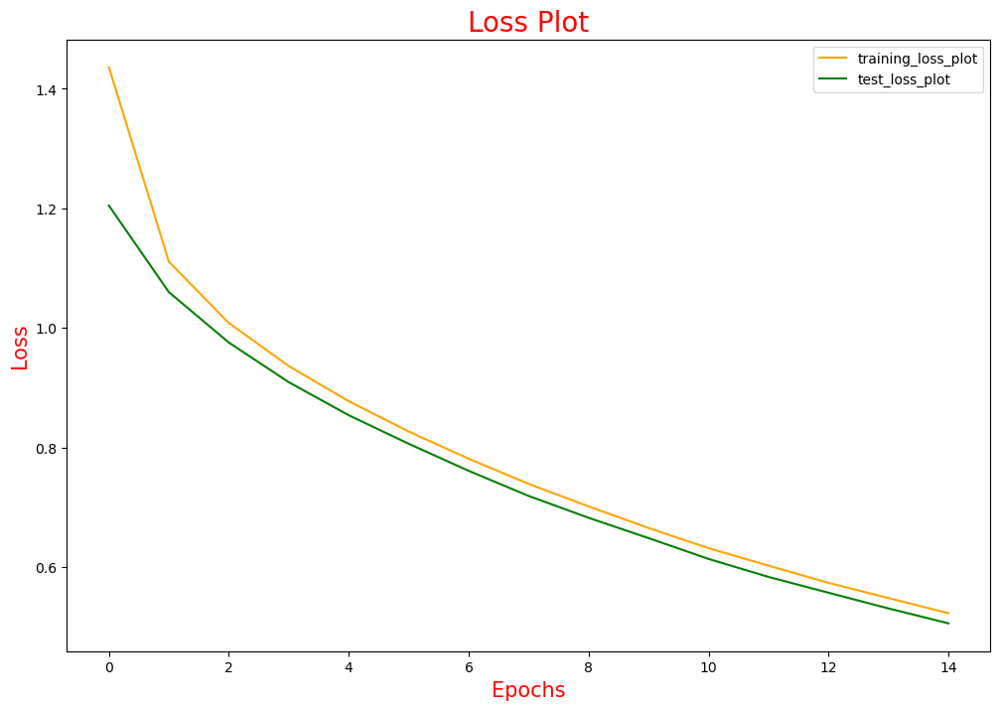

In [106]:
from matplotlib.pyplot import figure
figure(figsize=(12, 8))
plt.plot(loss_plot, color='orange', label = 'training_loss_plot')
plt.plot(test_loss_plot, color='green', label = 'test_loss_plot')
plt.xlabel('Epochs', fontsize = 15, color = 'red')
plt.ylabel('Loss', fontsize = 15, color = 'red')
plt.title('Loss Plot', fontsize = 20, color = 'red')
plt.legend()
plt.show()

In [107]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_feature_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_images(image)[0], 0) 
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder (img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden) # get the output from decoder

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy() 
        result.append (tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions

In [108]:
def plot_attention_map (caption, weights, image) :

  fig = plt.figure(figsize = (10, 10))
  temp_img = np.array(Image.open(image))

  cap_len = len(caption)
  for cap in range(cap_len) :
    weights_img = np.reshape(weights[cap], (8,8))
    wweights_img = np.array(Image.fromarray(weights_img).resize((224,224), Image.LANCZOS))

    ax = fig.add_subplot(cap_len//2, cap_len//2, cap+1)
    ax.set_title(caption[cap], fontsize = 14, color = 'red')

    img = ax.imshow(temp_img)

    ax.imshow(weights_img, cmap='gist_heat', alpha=0.6, extent=img.get_extent())
    ax.axis('off')
  plt.subplots_adjust(hspace=0.2, wspace=0.2)
  plt.show()

In [109]:
from nltk.translate.bleu_score import sentence_bleu

In [110]:
def filt_text(text):
    filt=['<start>','<unk>','<end>'] 
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [111]:
image_test = path_test.copy()

In [112]:
def pred_caption_audio(random, autoplay=False, weights=(0.5, 0.5, 0, 0)) :

    cap_test_data = caption_test.copy()
    rid = np.random.randint(0, random)
    test_image = image_test[rid]

    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_test_data[rid] if i not in [0]])
    result, attention_plot, pred_test = evaluate(test_image)

    real_caption=filt_text(real_caption)      

    pred_caption=' '.join(result).rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = pred_caption.split()

    score = sentence_bleu(reference, candidate, weights=weights)
    print(f"BELU score: {score*100}")
    print ('Real Caption:', real_caption)
    print ('Prediction Caption:', pred_caption)
    plot_attention_map(result, attention_plot, test_image)

    speech = gTTS('Predicted Caption : ' + pred_caption, lang = 'en', slow = False)
    speech.save('voice.mp3')
    audio_file = 'voice.mp3'

    display.display(display.Audio(audio_file, rate = None, autoplay = autoplay))

    return test_image
    

BELU score: 51.49052924789205
Real Caption: the smu basketball player drives to the basket
Prediction Caption: the smu basketball player in white


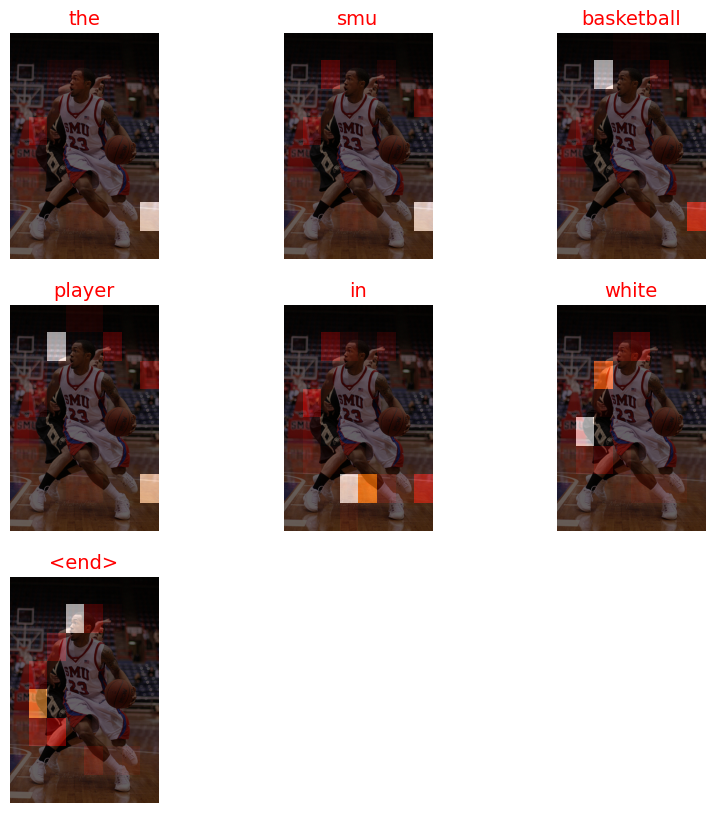

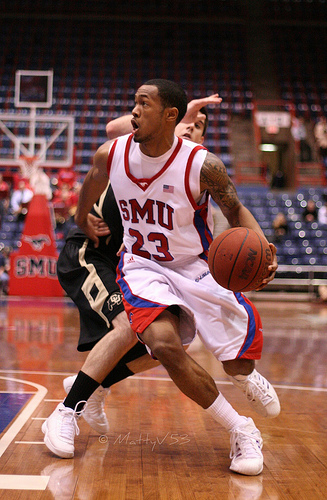

In [147]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 77.44477607662643
Real Caption: two black dogs are playing with an orange stuffed dog toy
Prediction Caption: two black dogs are playing with an orange toy


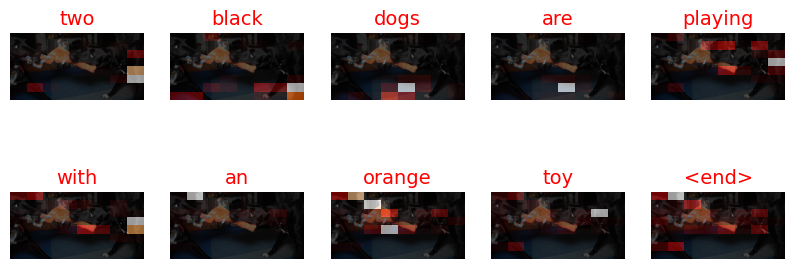

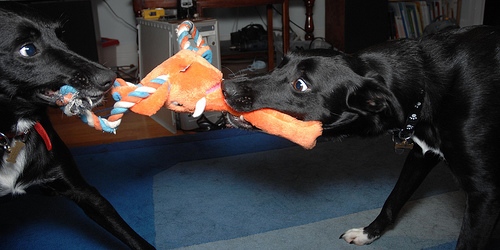

In [148]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 78.41475134249411
Real Caption: dog is jumping into swimming pool after duck
Prediction Caption: dog is jumping into swimming pool to catch duck


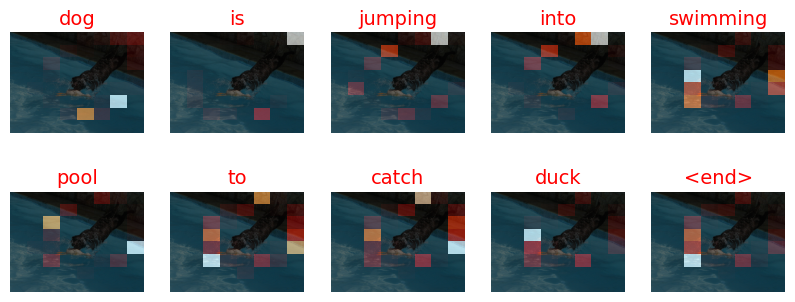

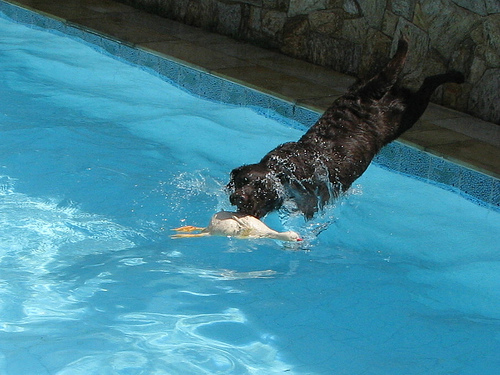

In [150]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

C:\Users\SIDDHARTH\anaconda3\Lib\site-packages\nltk\translate\bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
C:\Users\SIDDHARTH\anaconda3\Lib\site-packages\nltk\translate\bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


BELU score: 37.647931865968445
Real Caption: toddler boy stands by wooden fence
Prediction Caption: boy in striped shirt peering off wooden fence


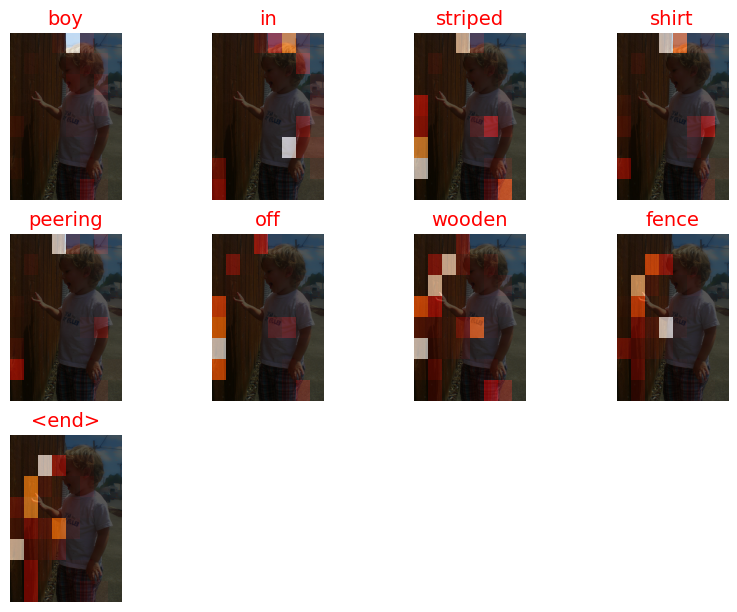

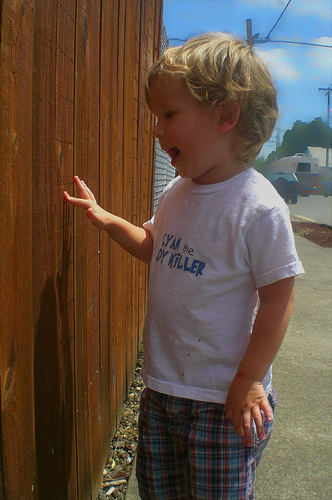

In [151]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 54.88116360940264
Real Caption: woman pulls an inflatable boat into the water
Prediction Caption: woman pulls an inflatable boat


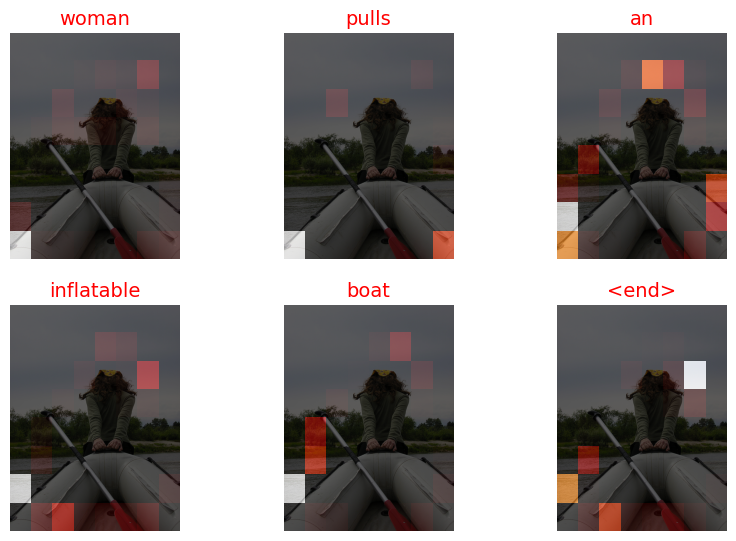

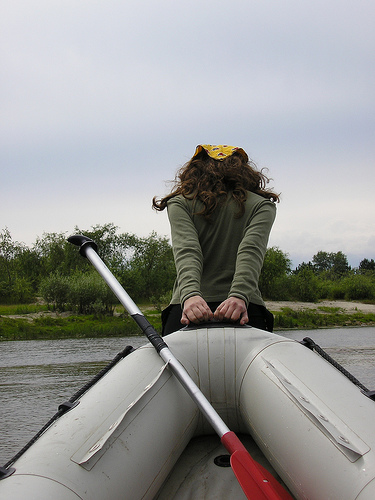

In [157]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 68.65890479690393
Real Caption: miniature dachshund has an apron on its back
Prediction Caption: miniature dachshund has an apron is running on grass


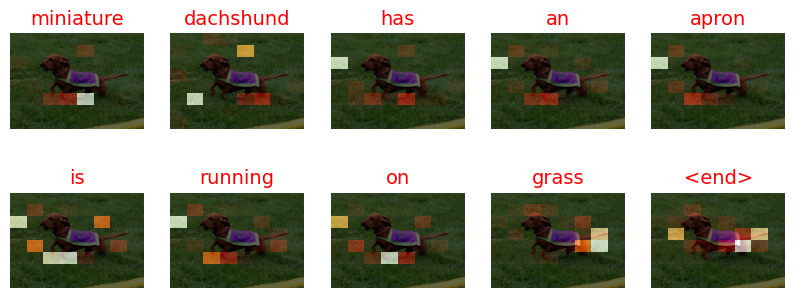

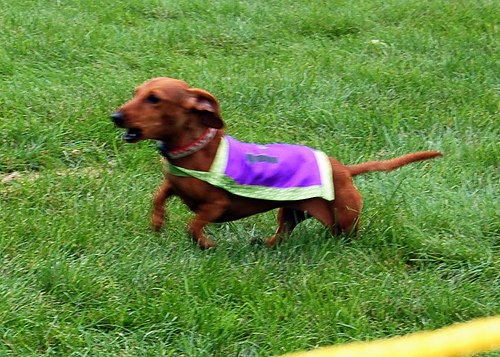

In [158]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 59.138730477060875
Real Caption: small black and white dog jumps with an object in its mouth
Prediction Caption: black and white dog is catching frisbee in its mouth


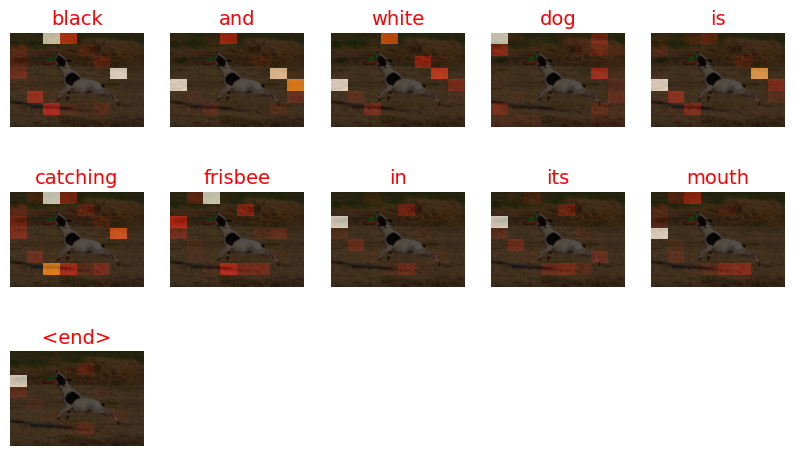

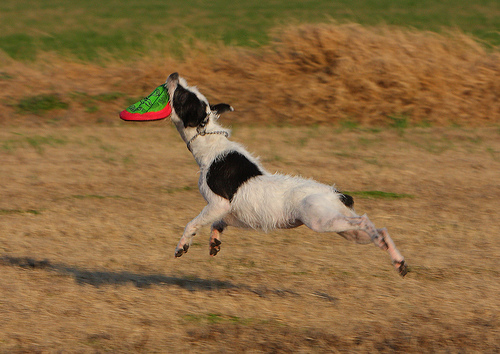

In [159]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

C:\Users\SIDDHARTH\anaconda3\Lib\site-packages\nltk\translate\bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


BELU score: 49.89637250001092
Real Caption: man in black is eating baked good near two elderly men
Prediction Caption: man in black UNK gray coat eats baked good wire fence


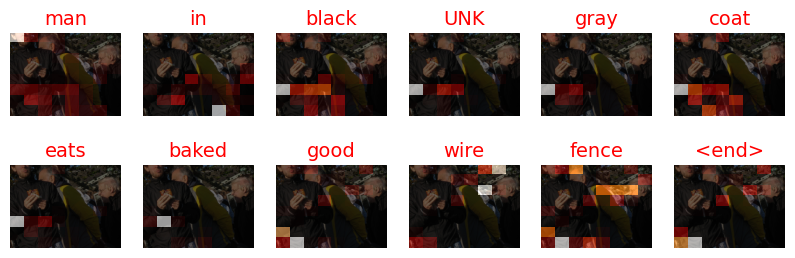

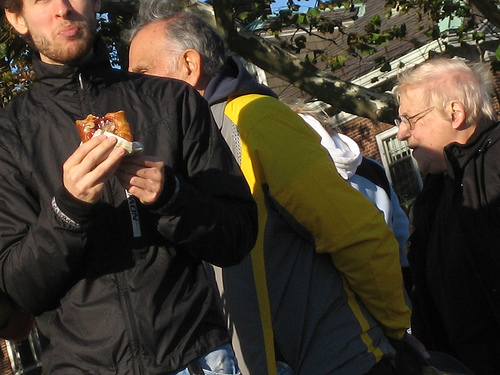

In [161]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 100.0
Real Caption: man wearing kilt is playing the bagpipes
Prediction Caption: man wearing kilt is playing the bagpipes


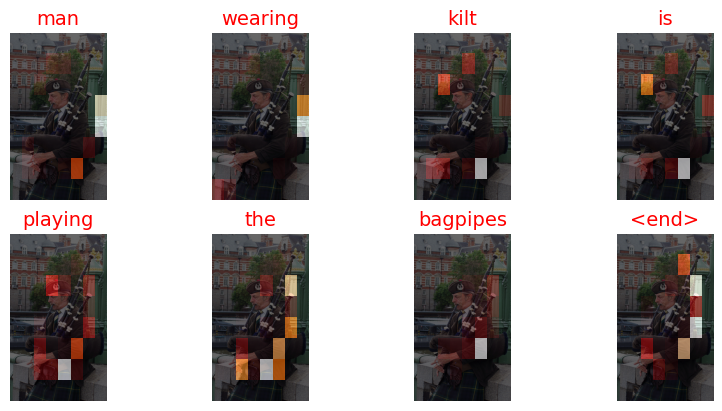

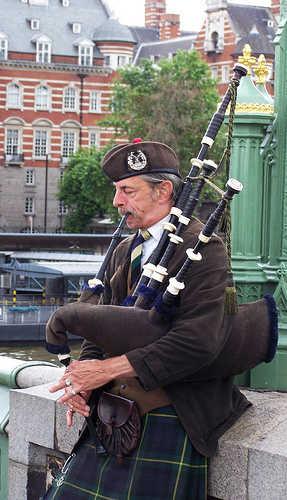

In [165]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 75.29586373193689
Real Caption: tennis player about to hit the ball
Prediction Caption: tennis player gets ready to hit the ball


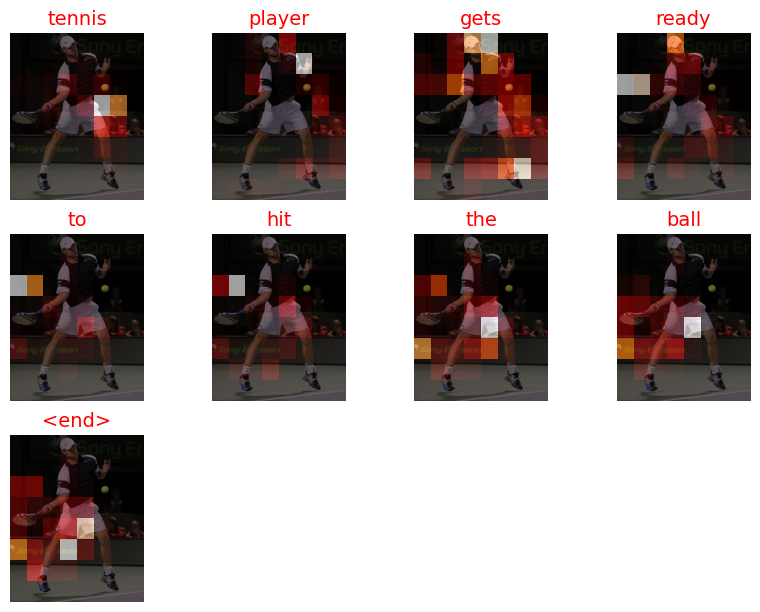

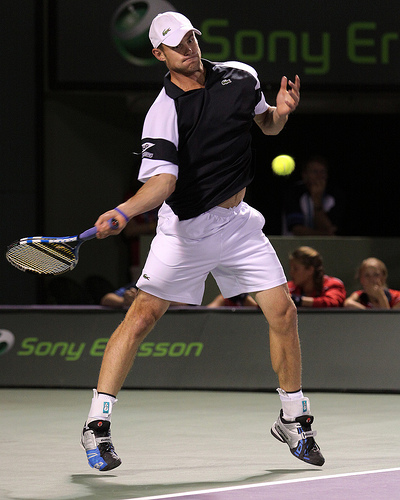

In [174]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 52.16948600244291
Real Caption: person doing trick on bike
Prediction Caption: man wearing white suit is doing trick on bike


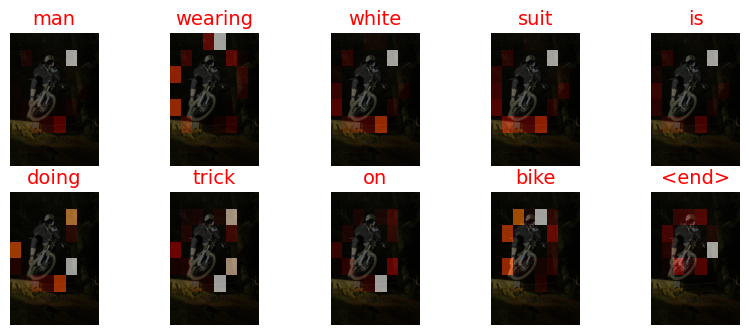

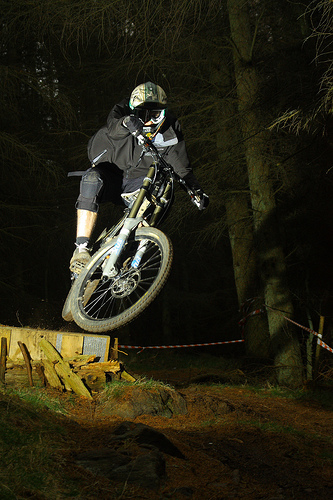

In [178]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 100.0
Real Caption: two white dogs are playing on the grass
Prediction Caption: two white dogs are playing on the grass


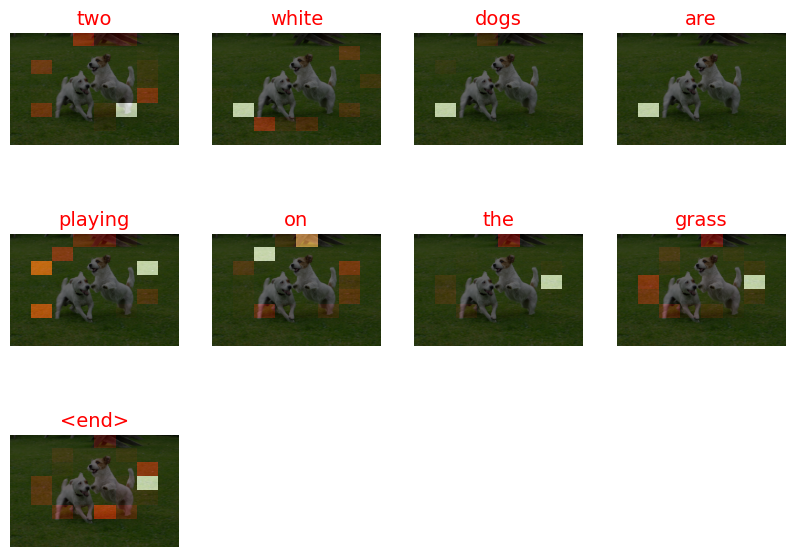

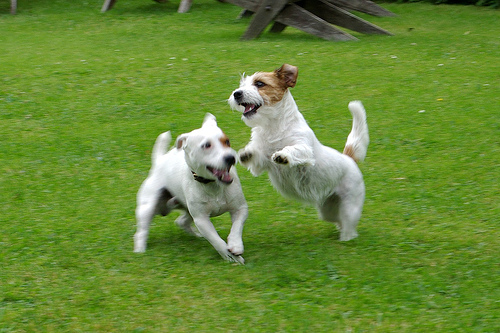

In [177]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)